# Investigate vpt_3d_DAPI_nuclei

In particular on ABC_s3_r0 where it failed

In [40]:
from math import ceil
from pathlib import Path
import anndata as ad
import matplotlib.pyplot as plt

sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s1_r0")
sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s2_r0")
sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s3_r0")
sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s4_r0")
sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s5_r0")
sample_dir = Path("/dss/dsshome1/0C/ra98gaq/git/cellseg-benchmark/data/samples/ABCAtlas_s6_r0")


results_dir = sample_dir / "results"

def load_coords(table_path):
    a = ad.read_zarr(table_path)
    if "spatial" in a.obsm:
        xy = a.obsm["spatial"]
        return xy[:, 0], xy[:, 1]
    cols = {c.lower(): c for c in a.obs.columns}
    xk = cols.get("center_x") or cols.get("x")
    yk = cols.get("center_y") or cols.get("y")
    return a.obs[xk].values, a.obs[yk].values


In [41]:
methods = {}
for m in sorted(p.name for p in results_dir.iterdir() if p.is_dir()):
    t = results_dir / m / "sdata.zarr" / "tables" / "table"
    if t.exists():
        try:
            methods[m] = load_coords(t)
        except Exception as e:
            print(f"skip {m}: {e}")
print(f"{len(methods)} methods with tables:", list(methods))

36 methods with tables: ['Baysor_2D_Cellpose_1_DAPI_PolyT_0.2', 'Baysor_2D_Cellpose_1_DAPI_PolyT_0.8', 'Baysor_2D_Cellpose_1_DAPI_Transcripts_0.2', 'Baysor_2D_Cellpose_1_DAPI_Transcripts_0.8', 'Baysor_2D_Cellpose_1_nuclei_model_1.0', 'Baysor_2D_Cellpose_2_DAPI_PolyT_0.2', 'Baysor_2D_Cellpose_2_DAPI_PolyT_0.8', 'Baysor_2D_Cellpose_2_DAPI_Transcripts_0.2', 'Baysor_2D_Cellpose_2_DAPI_Transcripts_0.8', 'Cellpose_1_DAPI_PolyT', 'Cellpose_1_DAPI_Transcripts', 'Cellpose_1_nuclei_model', 'Cellpose_2_DAPI_PolyT', 'Cellpose_2_DAPI_Transcripts', 'Ficture_segments', 'Ficture_segments_dapi', 'Negative_Control_Rastered_10', 'Negative_Control_Rastered_25', 'Negative_Control_Rastered_5', 'Negative_Control_Visium', 'Negative_Control_Voronoi', 'Proseg_3D_Cellpose_1_DAPI_PolyT', 'Proseg_3D_Cellpose_1_DAPI_Transcripts', 'Proseg_3D_Cellpose_1_nuclei_model', 'Proseg_3D_Cellpose_2_DAPI_PolyT', 'Proseg_3D_Cellpose_2_DAPI_Transcripts', 'Proseg_3D_vpt3D_DAPI_PolyT', 'Proseg_3D_vpt3D_DAPI_PolyT_nuclei', 'Proseg_

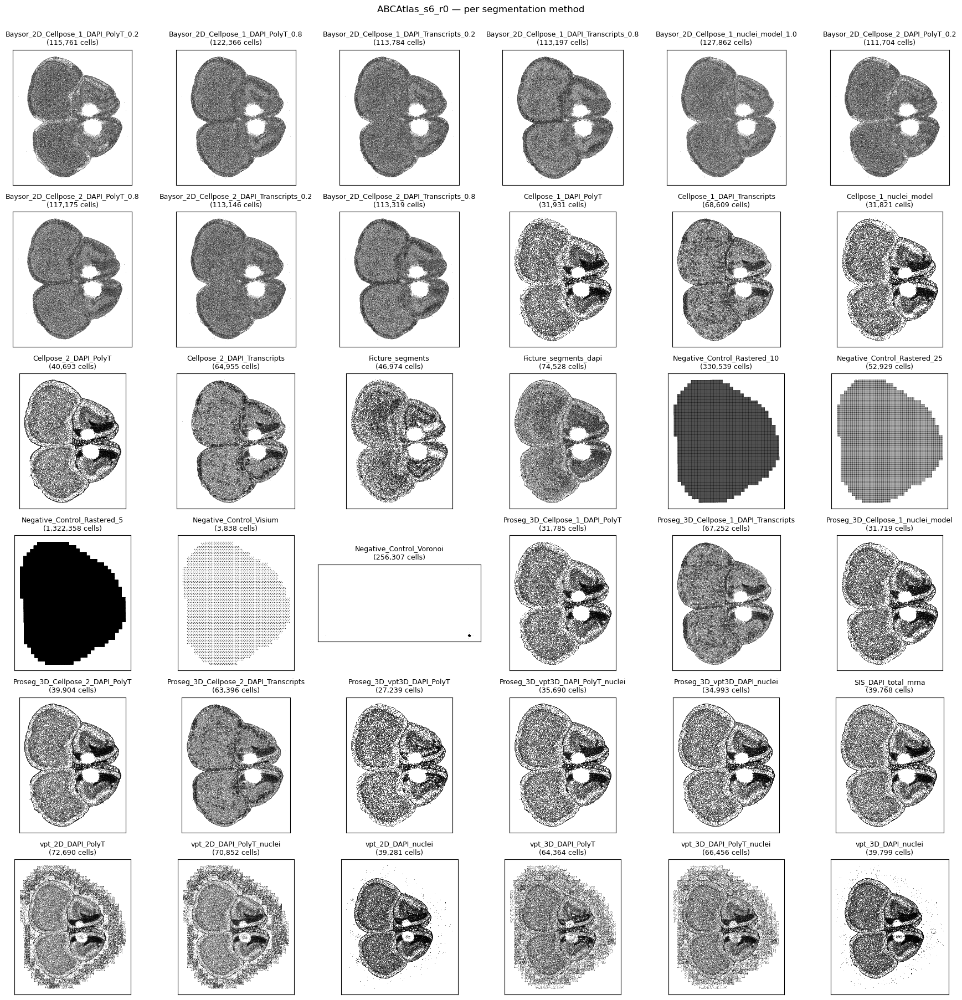

In [36]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

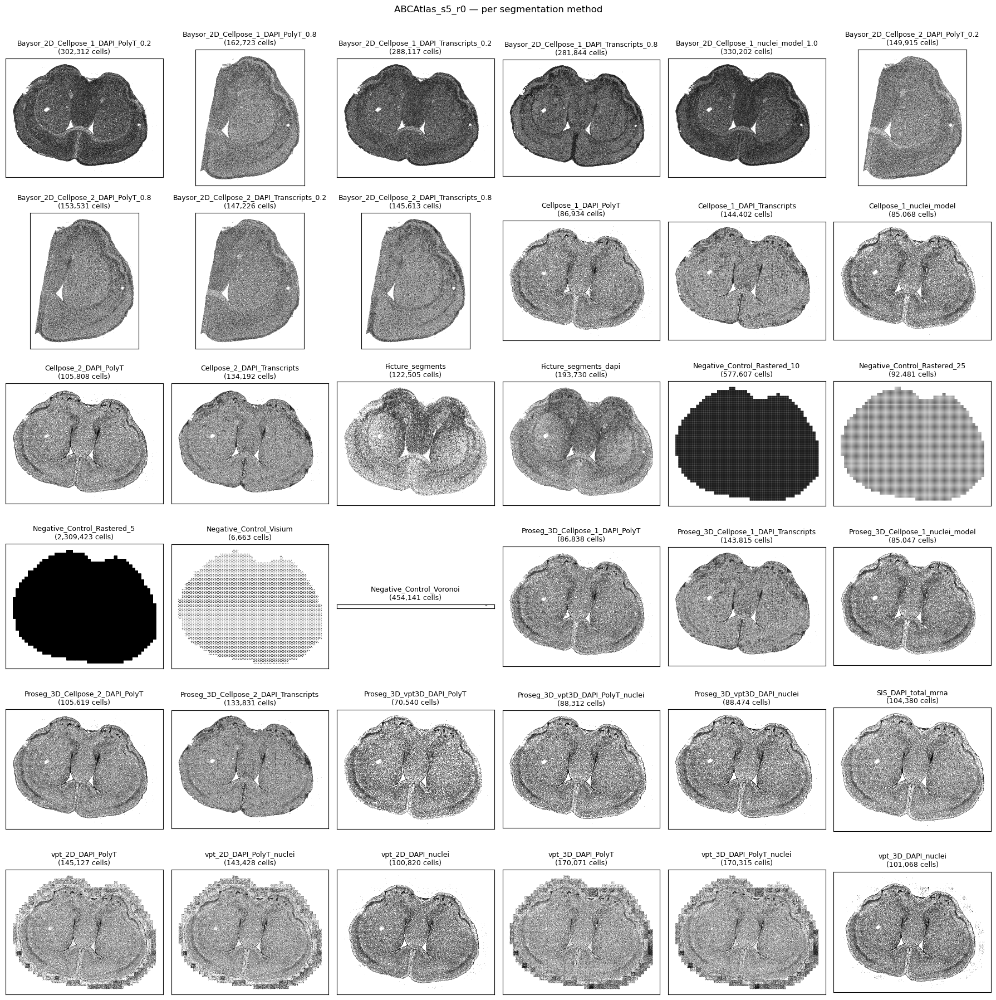

In [33]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

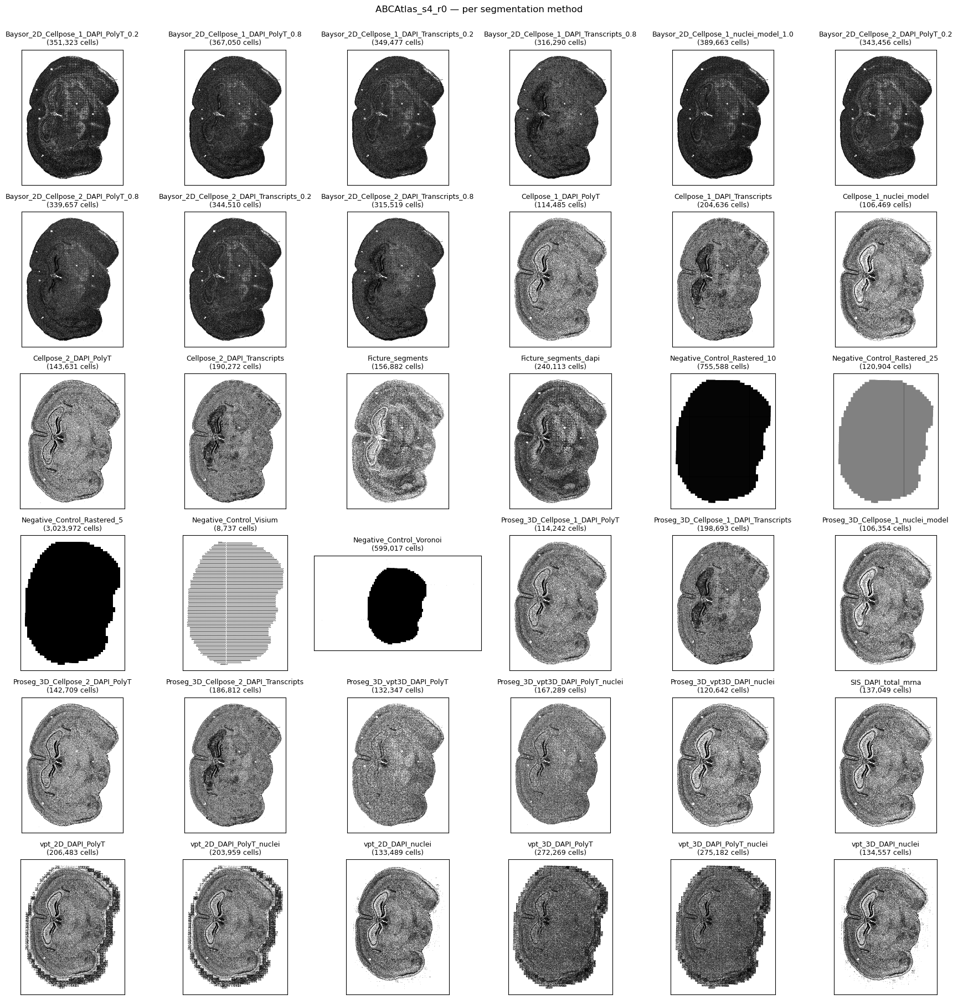

In [27]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

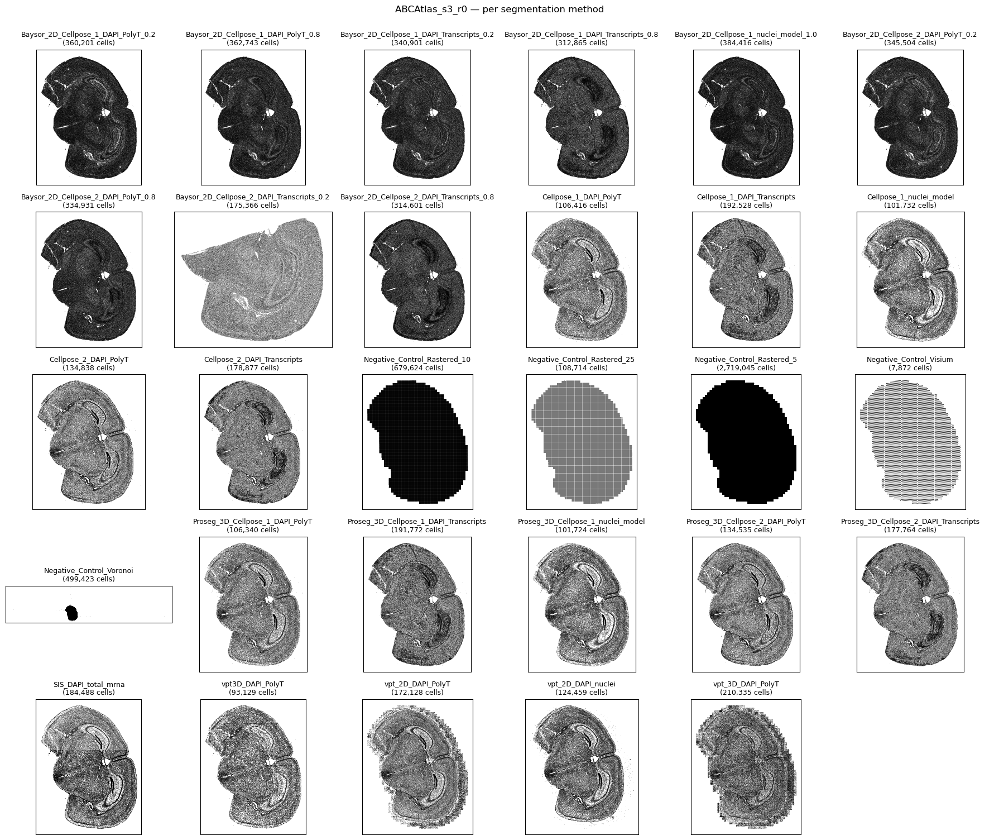

In [30]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

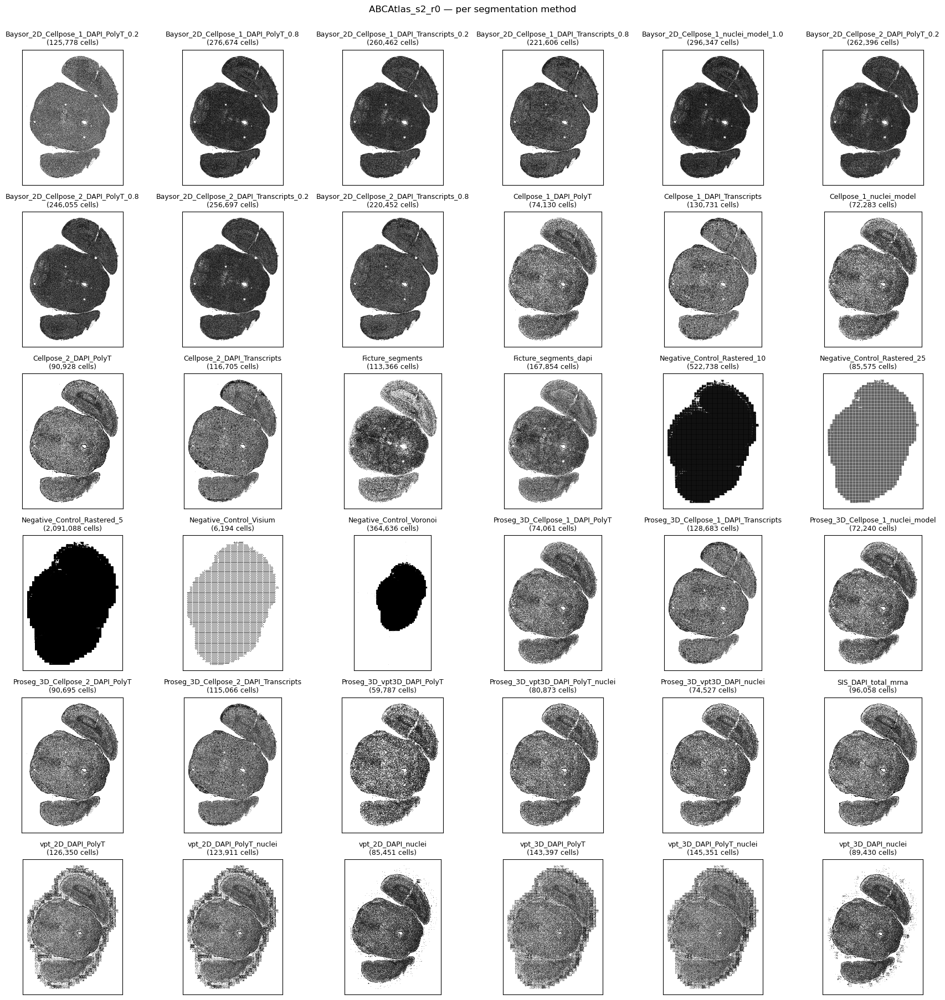

In [42]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

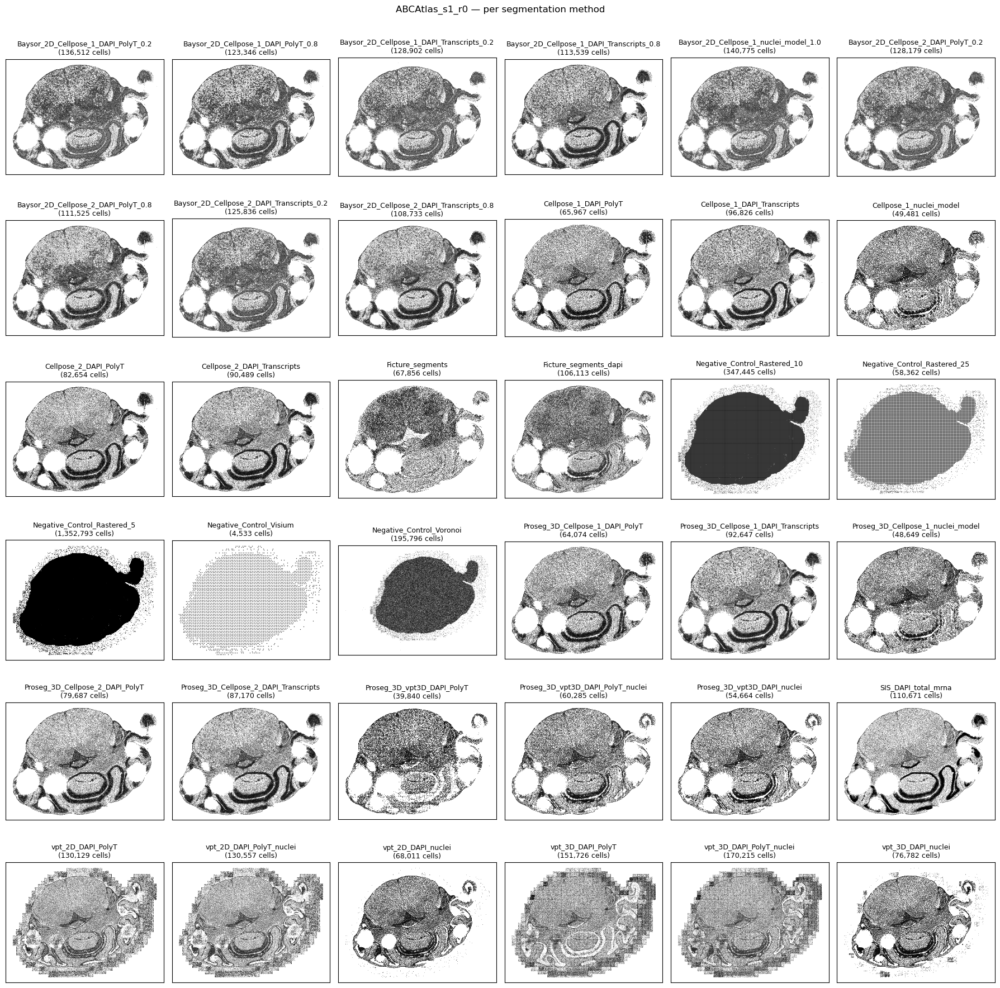

In [39]:
n = len(methods)
ncol = min(6, n)
nrow = ceil(n / ncol)
fig, axes = plt.subplots(nrow, ncol, figsize=(3 * ncol, 3 * nrow), squeeze=True)
for ax, (m, (x, y)) in zip(axes.flat, methods.items()):
    s = max(0.05, min(1, 8000 / len(x)))
    ax.scatter(x, y, s=s, linewidths=0, alpha=0.8, c="k")
    ax.set_title(f"{m}\n({len(x):,} cells)", fontsize=9)
    ax.set_aspect("equal"); ax.invert_yaxis()
    ax.set_xticks([]); ax.set_yticks([])
for ax in axes.flat[n:]:
    ax.axis("off")
fig.suptitle(f"{sample_dir.name} — per segmentation method", y=1.0)
fig.tight_layout()
plt.show()

In [45]:
import numpy as np, tifffile
from pathlib import Path
from skimage.exposure import equalize_adapthist   # vpt's CLAHE backend

img_dir = Path("/dss/dssfs03/pn52re/pn52re-dss-0001/merfish-public-data/"
               "ABCAtlas-MouseBrain-500plex/1199651036/images")
x, y, w, h = 77539, 20800, 2800, 2800
clip_limit, kernel = 0.01, (100, 100)              # from vpt_3D_nuclei.json normalize

kept = 0
for z, fp in enumerate(sorted(img_dir.glob("mosaic_DAPI_z*.tif"))):
    mm = tifffile.memmap(fp); H, W = mm.shape[-2:]
    tile = np.zeros((h, w), mm.dtype)
    ys, xs = min(y+h, H), min(x+w, W)
    tile[:ys-y, :xs-x] = mm[y:ys, x:xs]

    nnz = int((tile > 0).sum())
    if tile.max() == 0:                            # truly empty -> CLAHE std = 0
        nstd = 0.0
    else:
        nstd = equalize_adapthist(tile, kernel_size=kernel, clip_limit=clip_limit).std()
    empty = nstd < 0.1
    kept += not empty
    print(f"z{z}: nonzero_px={nnz:>6}  raw_std={tile.std():.3g}  "
          f"clahe_std={nstd:.3f}  -> {'EMPTY' if empty else 'KEPT'}")

print(f"\n{kept}/7 z-planes kept (clahe_std >= 0.1)")
print("do_3D would run on", kept, "planes ->",
      "all-empty: already handled, no crash"      if kept == 0 else
      "DEGENERATE 1-2 planes: this is the crash"   if kept < 3 else
      "normal, not the crashing tile")

z0: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z1: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z2: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z3: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z4: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z5: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY
z6: nonzero_px=     0  raw_std=0  clahe_std=0.000  -> EMPTY

0/7 z-planes kept (clahe_std >= 0.1)
do_3D would run on 0 planes -> all-empty: already handled, no crash


In [46]:
import numpy as np, tifffile
from pathlib import Path
from skimage.exposure import equalize_adapthist

img_dir = Path("/dss/dssfs03/pn52re/pn52re-dss-0001/merfish-public-data/"
               "ABCAtlas-MouseBrain-500plex/1199651036/images")
mms = [tifffile.memmap(f) for f in sorted(img_dir.glob("mosaic_DAPI_z*.tif"))]
H, W = mms[0].shape[-2:]
WIN, STRIDE = 2800, 2600
clip_limit, kernel = 0.01, (100, 100)

def origins(extent):                       # matches vpt tiling (incl. clamped edge)
    o = list(range(0, max(extent - WIN, 0) + 1, STRIDE))
    last = extent - WIN
    if last > 0 and o[-1] != last: o.append(last)
    return o
X0, Y0 = origins(W), origins(H)

def kept_planes(x, y):
    idx = []
    for z, mm in enumerate(mms):
        ys, xs = min(y+WIN, H), min(x+WIN, W)
        tile = np.zeros((WIN, WIN), mm.dtype); tile[:ys-y, :xs-x] = mm[y:ys, x:xs]
        if tile.max() == 0: continue
        if equalize_adapthist(tile, kernel_size=kernel, clip_limit=clip_limit).std() >= 0.1:
            idx.append(z)
    return idx

cands = []
for ti, y in enumerate(Y0):
    for tj, x in enumerate(X0):
        # cheap prefilter (downsampled) -> only CLAHE "mixed" tiles
        sig = sum(mm[y:min(y+WIN,H):8, x:min(x+WIN,W):8].max() > 0 for mm in mms)
        if sig == 0 or sig == len(mms): continue
        k = kept_planes(x, y)
        if 0 < len(k) < 3:
            tile_idx = ti*len(X0) + tj
            cands.append((tile_idx, x, y, k))
            print(f"CRASH CANDIDATE  tile {tile_idx}  @ x={x} y={y}  kept z={k}")

print("\ncandidates:", cands)

CRASH CANDIDATE  tile 432  @ x=75400 y=33800  kept z=[4]
CRASH CANDIDATE  tile 433  @ x=77539 y=33800  kept z=[4]
CRASH CANDIDATE  tile 464  @ x=77539 y=36400  kept z=[4]
CRASH CANDIDATE  tile 465  @ x=0 y=39000  kept z=[4]
CRASH CANDIDATE  tile 496  @ x=0 y=41600  kept z=[4]
CRASH CANDIDATE  tile 527  @ x=0 y=44200  kept z=[4]
CRASH CANDIDATE  tile 558  @ x=0 y=46800  kept z=[4]
CRASH CANDIDATE  tile 589  @ x=0 y=49400  kept z=[4]
CRASH CANDIDATE  tile 590  @ x=2600 y=49400  kept z=[4]
CRASH CANDIDATE  tile 620  @ x=0 y=52000  kept z=[4]
CRASH CANDIDATE  tile 621  @ x=2600 y=52000  kept z=[4]
CRASH CANDIDATE  tile 651  @ x=0 y=54600  kept z=[4]
CRASH CANDIDATE  tile 652  @ x=2600 y=54600  kept z=[4]
CRASH CANDIDATE  tile 683  @ x=2600 y=57200  kept z=[4]
CRASH CANDIDATE  tile 713  @ x=0 y=59800  kept z=[4]
CRASH CANDIDATE  tile 714  @ x=2600 y=59800  kept z=[4]
CRASH CANDIDATE  tile 744  @ x=0 y=62400  kept z=[4]
CRASH CANDIDATE  tile 745  @ x=2600 y=62400  kept z=[4]
CRASH CANDIDATE 


KeyboardInterrupt



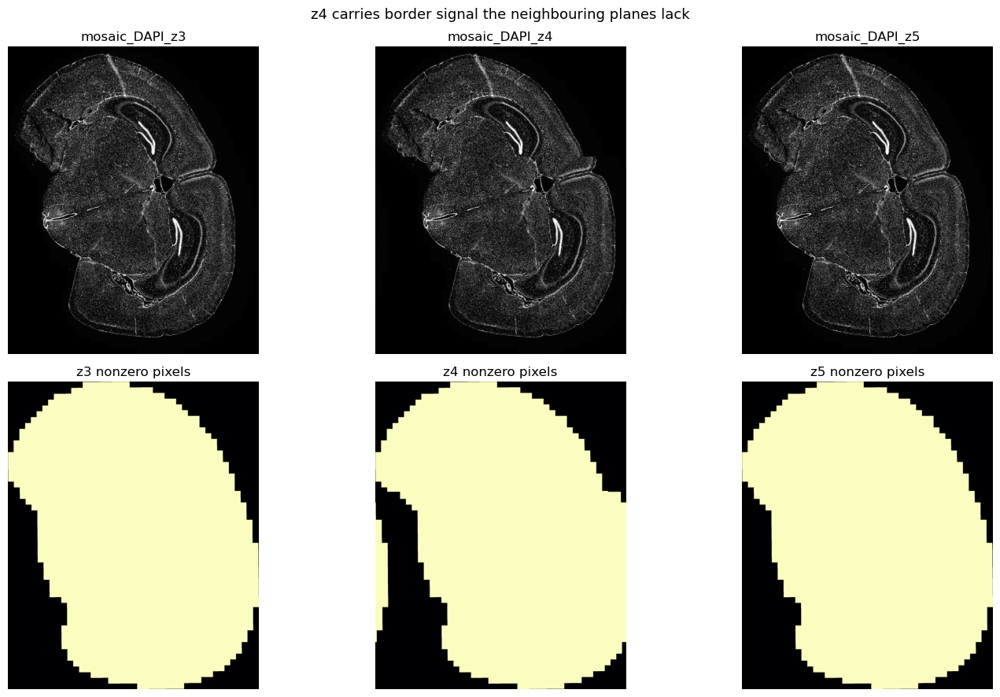

In [47]:
import numpy as np, tifffile, matplotlib.pyplot as plt
from pathlib import Path

img_dir = Path("/dss/dssfs03/pn52re/pn52re-dss-0001/merfish-public-data/"
               "ABCAtlas-MouseBrain-500plex/1199651036/images")
zs = [3, 4, 5]
ds = 40                                   # downsample factor

fig, ax = plt.subplots(2, len(zs), figsize=(5*len(zs), 9))
for j, z in enumerate(zs):
    mm = tifffile.memmap(img_dir / f"mosaic_DAPI_z{z}.tif")
    small = mm[::ds, ::ds]
    ax[0, j].imshow(small, cmap="gray", vmax=np.percentile(small, 99.5))
    ax[0, j].set_title(f"mosaic_DAPI_z{z}"); ax[0, j].axis("off")
    ax[1, j].imshow(small > 0, cmap="magma")          # nonzero map
    ax[1, j].set_title(f"z{z} nonzero pixels"); ax[1, j].axis("off")

fig.suptitle("z4 carries border signal the neighbouring planes lack", fontsize=13)
plt.tight_layout(); plt.show()

Got it: z4 from s3r0 is somehow shifted/broken. Hence, a signal appears at the left border, where all otehr z planes are empty. this results in a 3d segmentaiton error. solved be newly added catch: if signal is only in 1 plane, it's ignored.